In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tensorflow as tf

from tensorflow import keras
import os,sys
import albumentations as albu
from PIL import Image

%load_ext autoreload
%autoreload 2

# Loading the dataset

In [2]:
import helperC


In [3]:
# Loaded a set of images
root_dir = "Datasets/training/"

n = 100

image_dir = root_dir + "images/"
files = os.listdir(image_dir)
print("Loading " + str(n) + " images")
imgs = [helperC.load_image(image_dir + files[i]) for i in range(n)]

gt_dir = root_dir + "groundtruth/"
print("Loading " + str(n) + " images")
gt_imgs = [helperC.load_image(gt_dir + files[i]) for i in range(n)]

Loading 100 images
Loading 100 images


#### Data Augmentation
##### From https://towardsdatascience.com/road-detection-using-segmentation-models-and-albumentations-libraries-on-keras-d5434eaf73a8


In [4]:
#Doubles the nb of images. Needs improvement
for i in range(3):
    for n in range(len(gt_imgs)):
        augmented = helperC.image_augmentation(image_size = 256)(image=imgs[n], mask=gt_imgs[n])
        imgs.append(augmented['image'])
        gt_imgs.append(augmented['mask'])

In [5]:
# Extract patches from input images
patch_size = 16 # each patch is 16*16 pixels

img_patches = [helperC.img_crop(imgs[i], patch_size, patch_size) for i in range(len(imgs))]
gt_patches = [helperC.img_crop(gt_imgs[i], patch_size, patch_size) for i in range(len(gt_imgs))]

# Linearize list of patches
img_patches = np.asarray([img_patches[i][j] for i in range(len(img_patches)) for j in range(len(img_patches[i]))])
gt_patches =  np.asarray([gt_patches[i][j] for i in range(len(gt_patches)) for j in range(len(gt_patches[i]))])
gt_patches = helperC.patches_labelization(gt_patches)

## Feature processing 

#### Balancing amount of patches  background vs road for training

In [6]:

#img_patches, gt_patches = helper.feature_balancing(img_patches, gt_patches)
#Works badly!

# CNN

In [7]:
from tensorflow.keras import datasets, layers, models

## Layers

In [8]:
from keras.regularizers import l2
"""model = models.Sequential()
reg = 1e-6 # L2 regularization factor (used on weights, but not biases)
### heavily(!) inspired from a previous project. Needs to be changed/optimized
model.add(layers.Convolution2D(64, 5, 5, padding='same',input_shape=(16, 16, 3)))
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.MaxPooling2D(pool_size=(2,2), padding='same'))
model.add(layers.Dropout(0.25))
model.add(layers.Convolution2D(128, 3, 3,padding='same'))
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.MaxPooling2D(pool_size=(2,2), padding='same'))
model.add(layers.Dropout(0.25))
model.add(layers.Convolution2D(256, 3, 3, padding='same'))
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.MaxPooling2D(pool_size=(2,2), padding='same'))
model.add(layers.Dropout(0.25))
model.add(layers.Convolution2D(256, 3, 3, padding='same'))
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.MaxPooling2D(pool_size=(2,2), padding='same'))
model.add(layers.Dropout(0.25))
model.add(layers.Flatten())
model.add(layers.Dense(128, kernel_regularizer=l2(reg))) # Fully connected layer (128 neurons)
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(2, kernel_regularizer=l2(reg)))
"""

"""model = models.Sequential()

model.add(layers.Conv2D(32, (2, 2), input_shape=(16, 16, 3)))
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (2, 2)))
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.Conv2D(128, (2, 2)))
model.add(layers.LeakyReLU(alpha=0.1))

model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Flatten())
model.add(layers.Dense(64))
model.add(layers.LeakyReLU(alpha=0.1))
model.add(layers.Dense(2, activation='softmax'))"""
model = models.Sequential()
lrelu = lambda x: tf.keras.layers.LeakyReLU(alpha=0.1)(x)
kernel_size = (3,3)
pool_size = (2,2)
alpha_relu = 0.1
regularizer = 1e-6
shape = (16, 16, 3)

model.add(layers.Convolution2D(64,kernel_size,activation = lrelu, padding ='same', input_shape=shape))
model.add(layers.MaxPooling2D(pool_size))
model.add(layers.Convolution2D(64, kernel_size,activation = lrelu,padding ='same'))
model.add(layers.Dropout(0.1))
model.add(layers.MaxPooling2D(pool_size))

model.add(layers.Convolution2D(32, kernel_size,activation = lrelu,padding ='same'))
model.add(layers.MaxPooling2D(pool_size))
model.add(layers.Convolution2D(32,kernel_size,activation = lrelu,padding ='same'))
model.add(layers.Dropout(0.1))
model.add(layers.MaxPooling2D(pool_size))

model.add(layers.Convolution2D(128,kernel_size,activation = lrelu,padding ='same'))
#model.add(layers.MaxPooling2D(pool_size))
model.add(layers.Convolution2D(128,kernel_size,activation = lrelu,padding ='same'))
model.add(layers.Dropout(0.1))

model.add(layers.Flatten())
model.add(layers.Dense(2, activation='softmax'))


Using TensorFlow backend.


In [9]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 16, 16, 64)        1792      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 8, 8, 64)          0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 8, 64)          36928     
_________________________________________________________________
dropout (Dropout)            (None, 8, 8, 64)          0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 4, 4, 64)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 4, 4, 32)          18464     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 2, 2, 32)          0

## Training

In [10]:

def generate_minibatch(X, Y, batch_size):
    """
    Procedure for real-time minibatch creation and image augmentation.
     This runs in a parallel thread while the model is being trained.
    """
    Y = tf.keras.utils.to_categorical(Y, 2)
    while 1:
        # Generate one minibatch
        X_batch = np.empty((batch_size, 16,16, 3))
        Y_batch = np.empty((batch_size, 2))
        for i in range(batch_size):
            # Select a random image
            idx = np.random.choice(X.shape[0])
            shape = X[idx].shape
                    
            # The label does not depend on the image rotation/flip (provided that the rotation is in steps of 90°)
            X_batch[i] = X[idx]
            Y_batch[i] = Y[idx]
        yield (X_batch, Y_batch)
          

In [11]:
import math
batch_size = 64
steps_per_epoch = math.ceil(img_patches.shape[0] / batch_size)
"""def softmax_categorical_crossentropy(y_true, y_pred):
       
        Uses categorical cross-entropy from logits in order to improve numerical stability.
        This is especially useful for TensorFlow (less useful for Theano).           
        return K.categorical_crossentropy(y_pred, y_true, from_logits=True)
    """
model.compile(loss = "categorical_crossentropy",  optimizer = keras.optimizers.Adam(lr=1e-3),
              metrics = ['accuracy'])
#model.fit(img_patches, gt_patches, batch_size = 32, epochs = 2, validation_split = 0.2)
model.fit_generator(generate_minibatch(img_patches,gt_patches, batch_size),
                    epochs=10, steps_per_epoch= steps_per_epoch)


Epoch 1/10
7813/7813 [==============================] - 1613s 206ms/step - loss: 0.4553 - accuracy: 0.7801
Epoch 2/10
7813/7813 [==============================] - 1619s 207ms/step - loss: 0.3981 - accuracy: 0.8171
Epoch 3/10
7813/7813 [==============================] - 2080s 266ms/step - loss: 0.3737 - accuracy: 0.8310
Epoch 4/10
7813/7813 [==============================] - 1671s 214ms/step - loss: 0.3574 - accuracy: 0.8396
Epoch 5/10
7813/7813 [==============================] - 2275s 291ms/step - loss: 0.3457 - accuracy: 0.8460
Epoch 6/10
7813/7813 [==============================] - 1739s 223ms/step - loss: 0.3369 - accuracy: 0.8510
Epoch 7/10
7813/7813 [==============================] - 1871s 239ms/step - loss: 0.3288 - accuracy: 0.8550
Epoch 8/10
7813/7813 [==============================] - 3343s 428ms/step - loss: 0.3220 - accuracy: 0.8590
Epoch 9/10
7813/7813 [==============================] - 3293s 421ms/step - loss: 0.3158 - accuracy: 0.8615
Epoch 10/10
7813/7813 [==============

## Predictions

In [12]:
#predictions = model.predict(img_patches)
#predictions = (predictions[:,0] < predictions[:,1]) * 1
#predictions = np.squeeze(predictions)

In [13]:
#predictions = np.squeeze(helper.binarize_predictions(predictions))

In [14]:
#np.set_printoptions(threshold=sys.maxsize)
#print(predictions)

# Displaying predictions

In [15]:
"""# Display prediction as an image
img_idx = 2

img_indexed = imgs[img_idx]
img_pat = helper.img_crop(img_indexed, patch_size, patch_size)
img_pat = np.asarray(img_pat)
prediction = model.predict(img_pat)

w = gt_imgs[img_idx].shape[0]
h = gt_imgs[img_idx].shape[1]
predicted_im = helper.label_to_img_array(w, h, patch_size, patch_size, helper.binarize_predictions(prediction))
cimg = helper.concatenate_images(imgs[img_idx], predicted_im)
fig1 = plt.figure(figsize=(10, 10)) # create a figure with the default size 
plt.imshow(cimg, cmap='Greys_r')

new_img = helper.make_img_overlay(imgs[img_idx], predicted_im)

#plt.imshow(new_img)"""

"# Display prediction as an image\nimg_idx = 2\n\nimg_indexed = imgs[img_idx]\nimg_pat = helper.img_crop(img_indexed, patch_size, patch_size)\nimg_pat = np.asarray(img_pat)\nprediction = model.predict(img_pat)\n\nw = gt_imgs[img_idx].shape[0]\nh = gt_imgs[img_idx].shape[1]\npredicted_im = helper.label_to_img_array(w, h, patch_size, patch_size, helper.binarize_predictions(prediction))\ncimg = helper.concatenate_images(imgs[img_idx], predicted_im)\nfig1 = plt.figure(figsize=(10, 10)) # create a figure with the default size \nplt.imshow(cimg, cmap='Greys_r')\n\nnew_img = helper.make_img_overlay(imgs[img_idx], predicted_im)\n\n#plt.imshow(new_img)"

# Create Submission

In [16]:
import submission as sub

In [17]:
n = 50
patch_size = 16 

img_test = []

for i in range(1, 51):
    image_filename = 'Datasets/test_set_images/test_' + str(i) + '/test_' + str(i) + '.png' 
    img_test.append(helperC.load_image(image_filename))
img_patches_test = [helperC.img_crop(img_test[i], patch_size, patch_size) for i in range(n)]
img_patches_test = np.asarray([img_patches_test[i][j] for i in range(len(img_patches_test))
                               for j in range(len(img_patches_test[i]))])

In [18]:
predictions = model.predict(img_patches_test)
#predictions = np.squeeze(helper.binarize_predictions(predictions))
print(predictions.shape)
#print(predictions[10])


(72200, 2)


In [19]:


np.set_printoptions(threshold=sys.maxsize)
print(predictions.shape)
print(predictions)


(72200, 2)
[[3.44681412e-01 6.55318618e-01]
 [1.01727009e-01 8.98273051e-01]
 [3.08555067e-01 6.91444874e-01]
 [7.04357922e-01 2.95641989e-01]
 [6.16837621e-01 3.83162409e-01]
 [2.89136499e-01 7.10863471e-01]
 [9.40165818e-01 5.98341115e-02]
 [9.01735723e-01 9.82643291e-02]
 [9.44320560e-01 5.56794032e-02]
 [5.34036517e-01 4.65963483e-01]
 [3.63980490e-03 9.96360242e-01]
 [1.96280261e-03 9.98037159e-01]
 [3.80909592e-01 6.19090378e-01]
 [2.33332347e-03 9.97666717e-01]
 [3.74401367e-04 9.99625564e-01]
 [2.09014699e-01 7.90985286e-01]
 [2.59307493e-03 9.97406900e-01]
 [1.87475964e-01 8.12524080e-01]
 [5.85719347e-01 4.14280653e-01]
 [2.19469741e-01 7.80530334e-01]
 [1.06625762e-02 9.89337444e-01]
 [6.98504448e-01 3.01495552e-01]
 [6.83816075e-02 9.31618452e-01]
 [2.46178269e-01 7.53821790e-01]
 [5.03071770e-02 9.49692786e-01]
 [6.60529971e-01 3.39469969e-01]
 [1.04329556e-01 8.95670414e-01]
 [2.77970135e-02 9.72203016e-01]
 [4.34747078e-02 9.56525266e-01]
 [4.40426245e-02 9.55957353e-01]

### Post-processing

In [20]:

prediction_patches =[]
#predictions = np.squeeze(helper.binarize_predictions(predictions))
predictions = (predictions[:,0] < predictions[:,1]) * 1
predictions = np.squeeze(predictions)
for i in range(50):
    #predictions = np.squeeze(helper.binarize_predictions(predictions))
    #prediction = helper.binarize_predictions_array(predictions[i*1444 :((i*1444)+1444)])
    prediction = helperC.label_to_img_patches_test(predictions[i*1444 :((i*1444)+1444)])
    prediction = helperC.combine_surounded_patches(prediction) #Which order? Is it even useful. 
    prediction = helperC.remove_lonely_patches(prediction)
    prediction_patches.append(prediction) 


In [21]:

img_patches_test_mod = [helperC.img_crop(prediction_patches[i], 1, 1)
                        for i in range(len(prediction_patches))]

img_patches_test_mod =  np.asarray([img_patches_test_mod[i][j] for i in range(len(img_patches_test_mod))
                                     for j in range(len(img_patches_test_mod[i]))])

"""img_patches_test_mod = np.asarray([prediction_patches[i][j] for i in range(len(prediction_patches)) 
                               for j in range(len(prediction_patches[i]))])"""

predictions_mod = np.squeeze(img_patches_test_mod)

sub.create_pred_images(predictions_mod)


In [22]:
submission_filename = 'submission1.csv'
   
sub.create_submission(submission_filename)

File 'submission1.csv' created


(72200, 1, 1)
(72200, 16, 16, 3)


C:\Users\Cindy\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


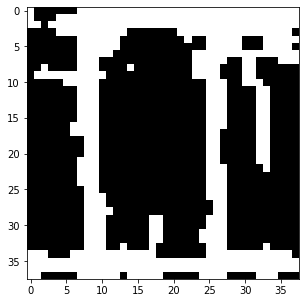

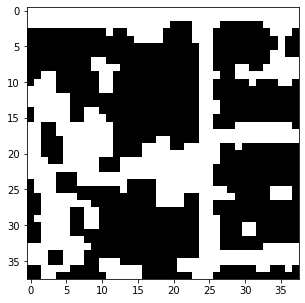

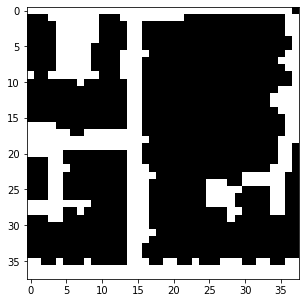

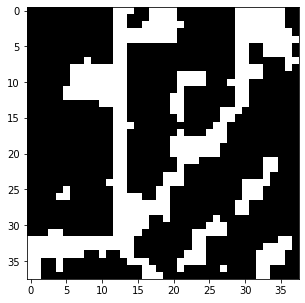

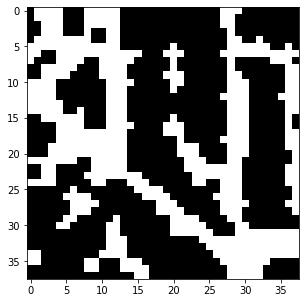

...

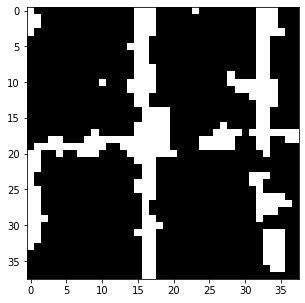

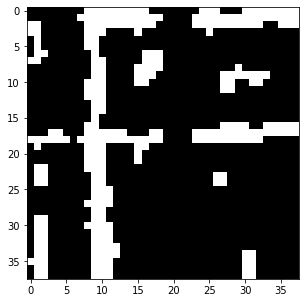

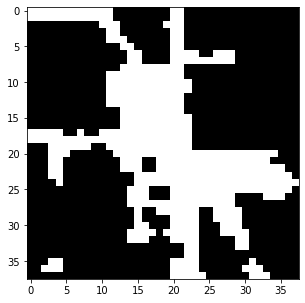

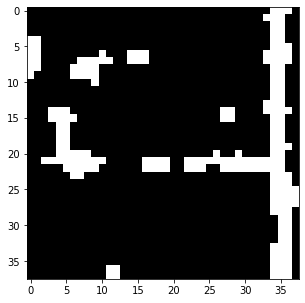

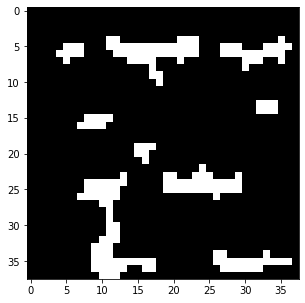

In [23]:
#Just to have a look..
print(img_patches_test_mod.shape)
print(img_patches_test.shape)
for i in range(25):
    fig1 = plt.figure(figsize=(5, 5))
    plt.imshow(prediction_patches[i], cmap='Greys_r')

C:\Users\Cindy\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


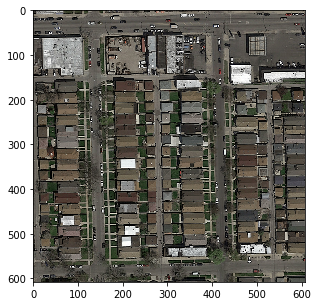

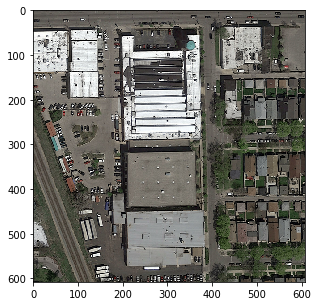

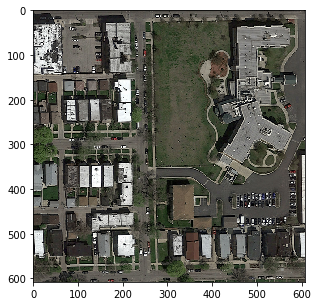

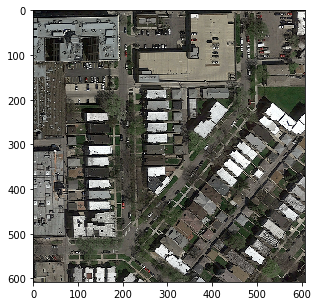

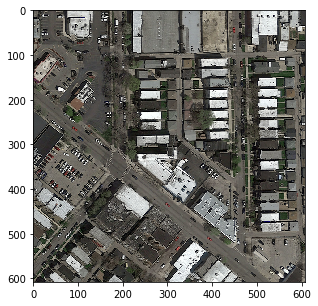

...

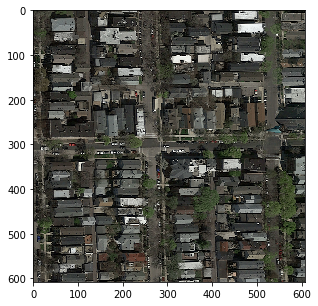

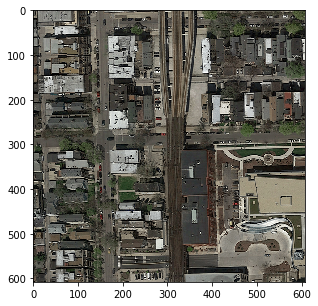

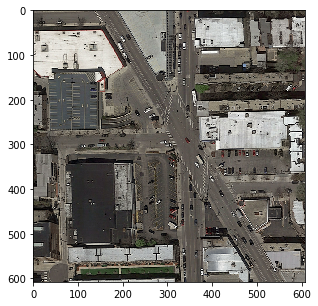

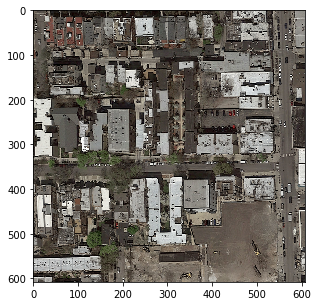

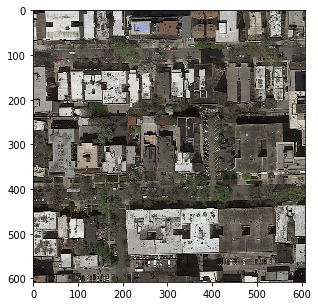

In [24]:
for i in range(25):
    fig1 = plt.figure(figsize=(5, 5))
    plt.imshow(img_test[i])